# AGESC stationnary Ekman model (Morales-Márquez 2021)


In [20]:
import numpy as np
import pandas as pd
import xarray as xr

import matplotlib.pyplot as plt

import os
from glob import glob

from cstes import swot_dir, drifters_dir, get_proj, lonlat2xy, zarr_dir
from swot import browse_swot_250, add_mask_inside_swot, build_swath_polygon

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.geodesic as cgeo
crs = ccrs.PlateCarree()

import cartopy.geodesic as geod
import cartopy.crs as ccrs
import cartopy.feature as cfeature


import pyproj
from pyproj import Geod

from rasterio.transform import Affine

import pynsitu as pyn

_________
# ERA5 data

In [21]:
era5 = ['/Users/mdemol/DATA_WIND/era5/2023_waves_interp.nc',
        '/Users/mdemol/DATA_WIND/era5/adaptor.mars.internal-1726002205.1540956-13738-7-c8d88fd1-3ec7-4113-8790-c92c59938aa6.nc',#u10 etc
        #'/Users/mdemol/DATA_WIND/era5/adaptor.mars.internal-1725888040.2442634-4062-7-717f5d1f-4dbc-4297-ba65-42766024d861.nc' # lon, lat wrong coords
        #'/Users/mdemol/DATA_WIND/era5/corrected_coords_d68.nc',# corrected coords
        '/Users/mdemol/DATA_WIND/era5/corrected_coords_d68_interp.nc'#ust, vst etc
       ]
era = xr.open_mfdataset(era5)
era['f'] = 2 * 2 * np.pi / 86164.1 * np.sin(era.latitude * np.pi / 180)
era = era.sortby('latitude').sel(longitude = slice(1, 6), latitude = slice(37.5, 43.5))

era['u10'] = era['u10'].assign_attrs({'long_name':r'Zonal wind velocity at 10m $u_{10}$', 'units':'m/s'})
era['v10'] = era['v10'].assign_attrs({'long_name':r'Meridional wind velocity at 10m $v_{10}$', 'units':'m/s'})

In [3]:
era 

<xarray.Dataset> Size: 393MB
Dimensions:    (longitude: 21, latitude: 25, time: 3672)
Coordinates:
  * longitude  (longitude) float32 84B 1.0 1.25 1.5 1.75 ... 5.25 5.5 5.75 6.0
  * latitude   (latitude) float32 100B 37.5 37.75 38.0 38.25 ... 43.0 43.25 43.5
  * time       (time) datetime64[ns] 29kB 2023-03-01 ... 2023-07-31T23:00:00
Data variables: (12/27)
    u10        (time, latitude, longitude) float64 15MB dask.array<chunksize=(3672, 25, 21), meta=np.ndarray>
    v10        (time, latitude, longitude) float64 15MB dask.array<chunksize=(3672, 25, 21), meta=np.ndarray>
    t2m        (time, latitude, longitude) float64 15MB dask.array<chunksize=(3672, 25, 21), meta=np.ndarray>
    ewss       (time, latitude, longitude) float64 15MB dask.array<chunksize=(3672, 25, 21), meta=np.ndarray>
    iews       (time, latitude, longitude) float64 15MB dask.array<chunksize=(3672, 25, 21), meta=np.ndarray>
    inss       (time, latitude, longitude) float64 15MB dask.array<chunksize=(3672, 25, 21), meta=np.ndarray>
    ...         ...
    swh        (time, latitude, longitude) float64 15MB dask.array<chunksize=(3672, 25, 21), meta=np.ndarray>
    shts       (time, latitude, longitude) float64 15MB dask.array<chunksize=(3672, 25, 21), meta=np.ndarray>
    ust        (time, latitude, longitude) float64 15MB dask.array<chunksize=(3672, 25, 21), meta=np.ndarray>
    vst        (time, latitude, longitude) float64 15MB dask.array<chunksize=(3672, 25, 21), meta=np.ndarray>
    mwp        (time, latitude, longitude) float32 8MB dask.array<chunksize=(3672, 25, 21), meta=np.ndarray>
    f          (latitude) float32 100B 8.878e-05 8.929e-05 ... 0.0001004
Attributes:
    Conventions:  CF-1.6
    history:      2024-09-10 21:05:21 GMT by grib_to_netcdf-2.28.1: /opt/ecmw...

In [4]:
era.mwd.max().compute()

<xarray.DataArray 'mwd' ()> Size: 8B
array(360.00111145)

/Users/mdemol/opt/anaconda3/envs/equinox/lib/python3.10/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/Users/mdemol/opt/anaconda3/envs/equinox/lib/python3.10/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/Users/mdemol/opt/anaconda3/envs/equinox/lib/python3.10/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/Users/mdemol/opt/anaconda3/envs/equinox/lib/python3.10/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/Users/mdemol/opt/anaconda3/envs/equinox/lib/python3.10/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/Users/mdemol/opt/an

__________
# Apply AGESC model
## For detailed description : 
Regionalizing the Impacts of Wind- and Wave-Induced Currents on Surface Ocean Dynamics: A Long-Term Variability Analysis in the Mediterranean Sea, Morales-Márquez 2021, https://onlinelibrary.wiley.com/doi/abs/10.1029/2020JC017104

## Summary

### Main assumptions
- Constant drag coefficient $A_z$
- monochromatic wavefield propagating in deep waters
### Constants and notations (vectors are in complex notation)
- Sea water density $\rho_w = 1.03$kg/m3
- Air density $\rho_a=1.2$kg/m3
- The gravity $g=9.81$m.s$^{-2}$
- Wind velocity at 10m $\vec{u}_{10}$ m/s and its norm $U_{10}$ (from ERA5)
- Neutral drag coefficient $C_D= (2.7/u_{10} + 0.142 +0.0764 u_{10})/1000 $
- Turbulent stress $\vec{\tau} = \rho_a C_D u_{10}\vec{u_{10}}$ N.m$^{-2}$
- Vertical eddy viscosity $A_z = 1.07 10^{-2}$ $m^2.s^{-1}$
- The Coriolis frequency $f$
- The characteritic Ekman layer depth $\delta = 1/m$ with $m= (1+i)\sqrt{f/2A_z}$
- The characteritic Stokes depth $\delta_s = 1/k$ with $k= \omega^2/g$
- The wave amplitude $a$ (from ERA5)
- The wave direction $\theta_w$ (from ERA5)
- The wave frequency $\omega$ ($2\pi/T$ from ERA5)
  
### Four ageostrophic currents components
$$ \vec{U_a}(z) = \vec{U}(z) +  \vec{U_{\tau_z}}(z) +\vec{U_S}(z)+ \vec{U_{ES}}(z) $$

- The classical Ekman component : $$ \vec{U}(z) = \frac{\vec{\tau}}{\rho_w A_z m}e^{mz} $$

  
- The current induced by the wave radiation stress : $$\vec{U_{\tau_z}}(z) = \frac{\partial_X S}{\rho_w A_z m }e^{mz}$$
  with $\partial_XS = [\partial_x S_{xx} + \partial_y S_{yx}] + i[\partial_x S_{xy} + \partial_y S_{yy}]$, $S_{xx} = E/2 cos^2(\theta_{\omega})$, $S_{xy} = S_{yx} = E/2 sin(\theta_{\omega}) cos(\theta_{\omega})$, $S_{yy} = E/2 sin^2(\theta_{\omega})$ with $E=\rho_w g a^2/2$

  
-  The stokes component = decreases over $\delta_s$, correlated with the dynamical response to the Coriolis-Stokes force :
$$\vec{U_S}(z) = \frac{m^2 U_{S0}}{4k^2 - m^2}e^{2kz}$$
with $U_{S0} = a^2 \omega k (cos(\theta_{\omega}) + i sin(\theta_{\omega})$


-  The Ekman-Stokes component = non linear interaction between wind and waves acting over the entire Ekman layer :
$$\vec{U_{ES}}(z) = - \frac{2 k m U_{S0}}{4k^2 -m^2}e^{mz}$$


In [17]:
def add_agesc_currents(z, era) :
    if z>0 :
        print('WARNING : z should be negative')
    era=era.copy()    
    #vars
    rhow = 1.03*1e3 #kg/m3
    rhoa = 1.2#kg/m3
    g = 9.81#m/s2
    a = era.swh#m
    U10 = era.u10 + 1j*era.v10#m/s
    u10 = np.sqrt(np.conj(U10)*U10)#m/s
    Cd = (2.7/u10 + 0.142 +0.0764*u10)/1e3
    R = 6378e3 #m
    Az = 1.07e-2#m2/s
    #Az = 1e-3#m2/s
    m=(1+1j)*np.sqrt(era.f/(2*Az))#/m
    tau = rhoa * Cd *u10 *U10
    #tau = era.iews + 1j *era.inss # N/m2
    E = rhow*g*a**2/2 #m.kg/s2 = N
    thetaw = era.mwd*np.pi/180 #rad
    omega = 2*np.pi/era.mwp #rad/s
    k = omega**2/g#/m
    #K = k*np.exp(1j*era.mwd*np.pi/180)
    
    # ue classical Ekman
    ue = tau/(rhow*Az*m) * np.exp(m*z)

    # utauz
    Sxx = E/2*np.cos(thetaw)**2
    Sxy = E/2*np.cos(thetaw)*np.sin(thetaw)
    Syx = Sxy
    Syy = E/2*np.cos(thetaw)**2
    dlon_dx = 1/(np.pi*R*np.cos(era.latitude * np.pi / 180))
    dlat_dy = 1/(np.pi*R)
    partialS = Sxx.differentiate('longitude')*dlon_dx + Sxy.differentiate('latitude')*dlat_dy + 1j*(Sxy.differentiate('longitude')*dlon_dx + Syy.differentiate('latitude')*dlat_dy)
    utauz = partialS/(rhow*Az*m) * np.exp(m*z)

    # us 
    us0 = a**2*omega*k*np.exp(1j*thetaw)
    us = (m**2 * us0) /(4*k**2 -m**2) *np.exp(2*k*z)

    #ues
    ues = - 2*k*m*us0/(4*k**2 - m**2)*np.exp(m*z)

    #in era
    era['ue'], era['ve'] = ue.real.assign_attrs({'long_name':r'Zonal AGESC $u_{Ekman}$', 'units':'m/s'}), ue.imag.assign_attrs({'long_name':r'Meridional AGESC $v_{Ekman}$', 'units':'m/s'})
    era['utauz'], era['vtauz'] = utauz.real.assign_attrs({'long_name':r'Zonal AGESC $u_{\tau_z}$', 'units':'m/s'}), utauz.imag.assign_attrs({'long_name':r'Meridional AGESC $v_{\tau_z}$', 'units':'m/s'})
    era['us'], era['vs'] = us.real.assign_attrs({'long_name':r'Zonal AGESC $u_{Stokes}$', 'units':'m/s'}), us.imag.assign_attrs({'long_name':r'Meridional AGESC $v_{Stokes}$', 'units':'m/s'})
    era['ues'], era['ves'] = ues.real.assign_attrs({'long_name':r'Zonal AGESC $u_{EkmanStokes}$', 'units':'m/s'}), ues.imag.assign_attrs({'long_name':r'Meridional AGESC $v_{EkmanStokes}$', 'units':'m/s'})
    era['us0'], era['vs0'] = us0.real.assign_attrs({'long_name':r'Zonal AGESC $u_{EkmanStokes}(z=0)$', 'units':'m/s'}), us0.imag.assign_attrs({'long_name':r'Meridional AGESC $v_{EkmanStokes}(z=0)$', 'units':'m/s'})

    # Total 
    era['ua'] = (era.ue +era.utauz + era.us + era.ues).assign_attrs({'long_name':r'Zonal AGESC $u_{ageo}$', 'units':'m/s'})
    era['va'] = (era.ve +era.vtauz + era.vs + era.ves).assign_attrs({'long_name':r'Meridional AGESC $u_{ageo}$', 'units':'m/s'})

    # Waves 
    era['uw'] = (era.utauz + era.us + era.ues).assign_attrs({'long_name':r'Zonal AGESC $u_{waves}$', 'units':'m/s'})
    era['vw'] = (era.vtauz + era.vs + era.ves).assign_attrs({'long_name':r'Meridional AGESC $v_{waves}$', 'units':'m/s'})
    
    #Ekman rio
    if z==0 :
        theta0 = - 22.5 * np.pi / 180 * np.sign(era.f)
        beta0 = 0.6
        era['urio'] = (beta0 * (np.cos(theta0) * era.iews - np.sin(theta0) * era.inss)).assign_attrs({'long_name':r'Zonal Rio $u_{Ekman}$', 'units':'m/s'})
        era['vrio'] = (beta0 * (np.sin(theta0) * era.iews + np.cos(theta0) * era.inss)).assign_attrs({'long_name':r'Meridional Rio $v_{Ekman}$', 'units':'m/s'})
    if z==-15 :
        theta15 = - 37.5 * np.pi / 180 * np.sign(era.f)#adapted for mediterranean sea
        beta15 = 0.15
        era['urio'] = (beta15 * (np.cos(theta15) * era.iews - np.sin(theta15) * era.inss)).assign_attrs({'long_name':r'Zonal Rio $u_{Ekman}$', 'units':'m/s'})
        era['vrio'] = (beta15 * (np.sin(theta15) * era.iews + np.cos(theta15) * era.inss)).assign_attrs({'long_name':r'Meridional Rio $v_{Ekman}$', 'units':'m/s'})

    # Norms
    for v in ['ve', 'vtauz', 'vs', 'ves', 'vrio', 'va', 'vw', 'v10'] :
        era[v.replace('v', 'U')] = np.sqrt(era[v.replace('v', 'u')]**2 + era[v]**2).assign_attrs({'long_name':era[v].attrs['long_name'].replace('Meridional', '').replace('v_','U_'), 'units':'m/s'})
    
    return era

era0 = add_agesc_currents(0, era)
era15 = add_agesc_currents(-15, era)  

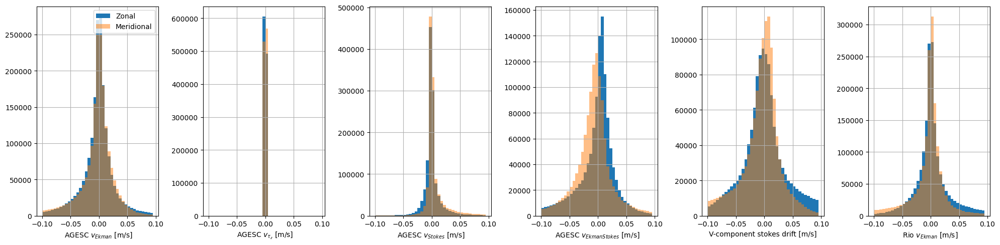

In [19]:
fig, axs = plt.subplots(1, 6 , figsize=(20, 5))
axs =axs.flatten()

era_ = era0
bins = np.arange(-0.1, 0.1, 0.005)
ax=axs[0]
era_.ue.plot.hist(bins = bins, ax=ax, label = 'Zonal')
era_.ve.plot.hist(bins = bins, ax=ax, alpha = 0.5, label = 'Meridional')
ax.set_xlabel(era_.ve.attrs['long_name'].replace('Meridional', '')+' [m/s]')
ax.legend()
ax=axs[1]
era_.utauz.plot.hist(bins = bins, ax=ax)
era_.vtauz.plot.hist(bins = bins, ax=ax, alpha = 0.5)
ax.set_xlabel(era_.vtauz.attrs['long_name'].replace('Meridional', '')+' [m/s]')

ax=axs[2]
era_.us.plot.hist(bins = bins,ax=ax)
era_.vs.plot.hist(bins = bins,ax=ax, alpha = 0.5)
ax.set_xlabel(era_.vs.attrs['long_name'].replace('Meridional', '')+' [m/s]')

ax=axs[3]
era_.ues.plot.hist(bins = bins, ax=ax)
era_.ves.plot.hist(bins = bins, ax=ax, alpha = 0.5)
ax.set_xlabel(era_.ves.attrs['long_name'].replace('Meridional', '')+' [m/s]')

ax=axs[4]
era_.ust.plot.hist(bins = bins, ax=ax)
era_.vst.plot.hist(bins = bins, ax=ax, alpha = 0.5)
ax.set_xlabel(era_.vst.attrs['long_name'].replace('Meridional', '')+' [m/s]')

ax=axs[5]
era_.urio.plot.hist(bins = bins, ax=ax)
era_.vrio.plot.hist(bins = bins, ax=ax, alpha = 0.5)
ax.set_xlabel(era_.vrio.attrs['long_name'].replace('Meridional', '')+' [m/s]')

for ax in axs :
    ax.grid()
fig.tight_layout()

In [23]:
def plot_u(era, vkey, ax, vmin, vmax, **kwargs) : 
    if vkey == 'v10' : s, c = 120, 'g'
    else : s, c = vmax*10, 'magenta'
    era[vkey.replace('v', 'U')].plot(ax=ax, transform=crs,vmin=vmin, vmax=vmax, **kwargs)
    P = era_.plot.quiver('longitude', 'latitude', vkey.replace('v', 'u'), vkey, color=c, scale = s, transform=crs, ax=ax, clip_on = False, add_guide = False)
    ax.add_feature(cfeature.LAND,zorder=10)
    gl = ax.gridlines(draw_labels=True,)
    ax.set_title(era[vkey.replace('v', 'U')].attrs['long_name'])

# Snapshots

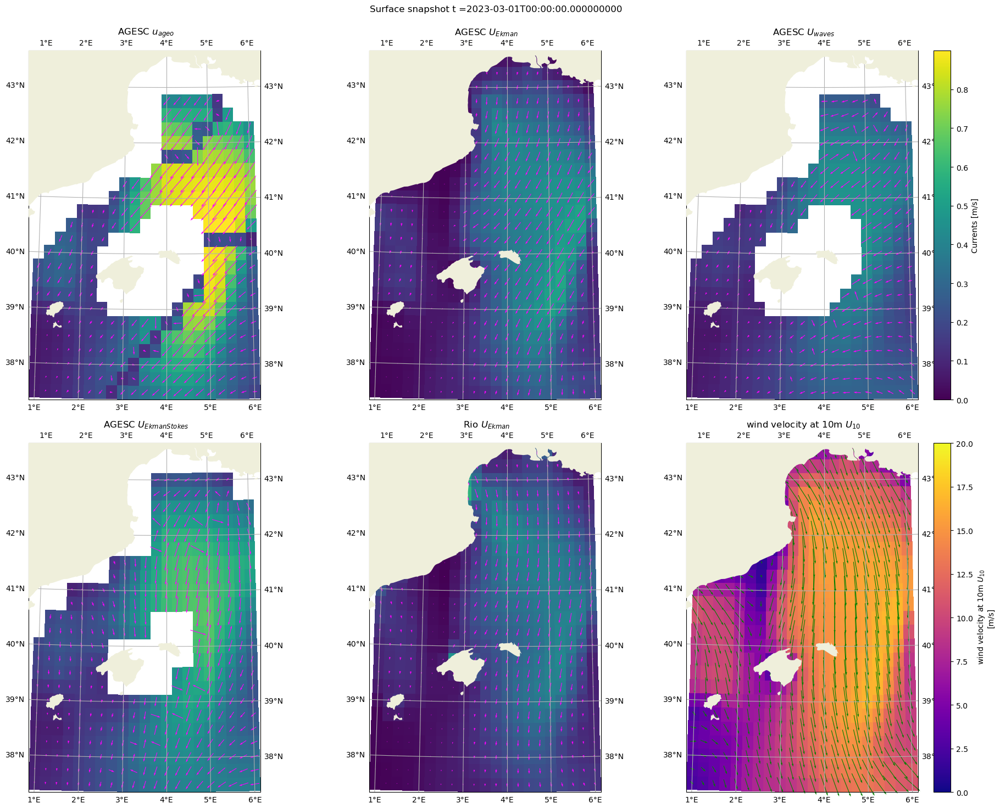

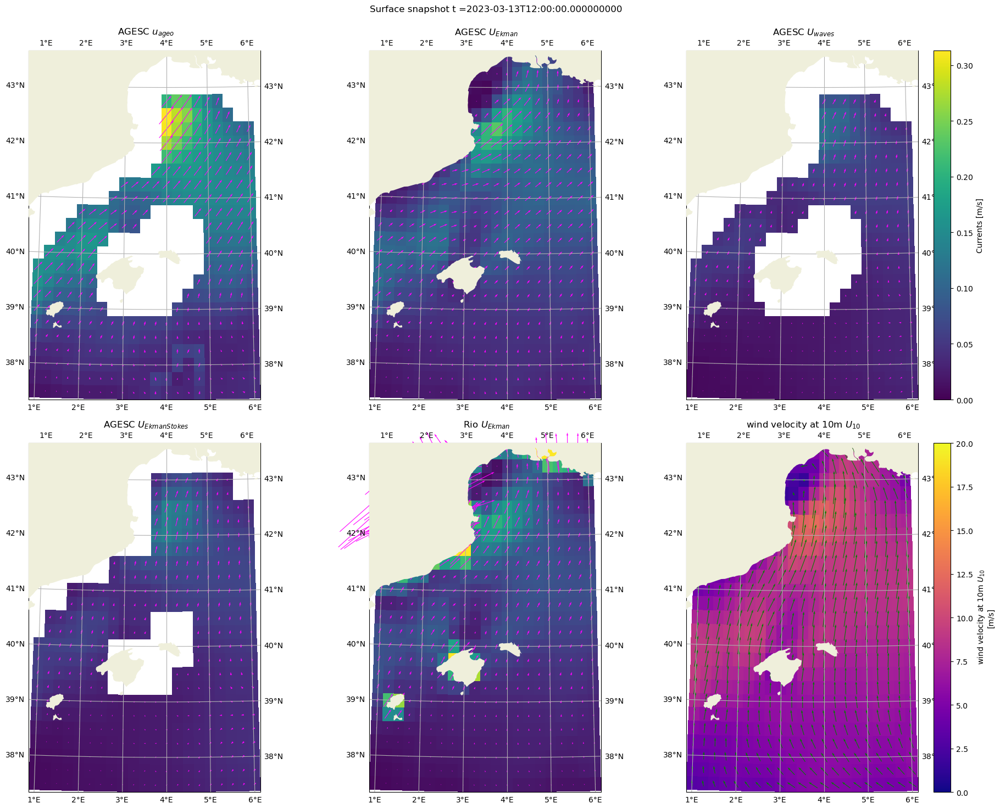

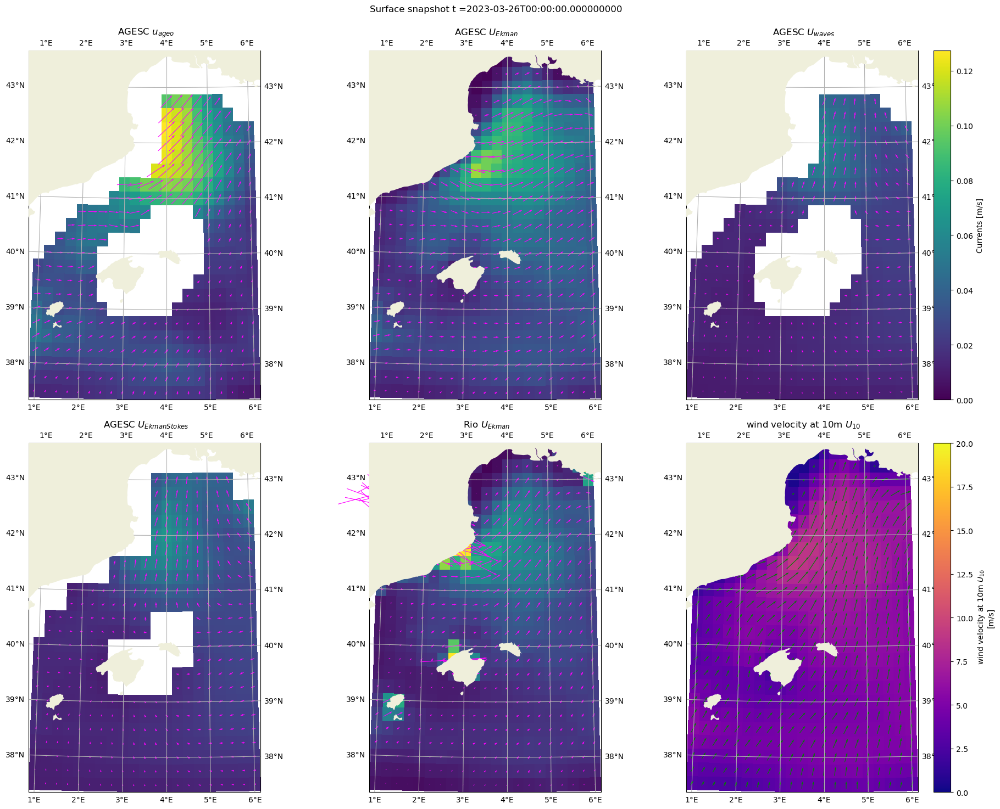

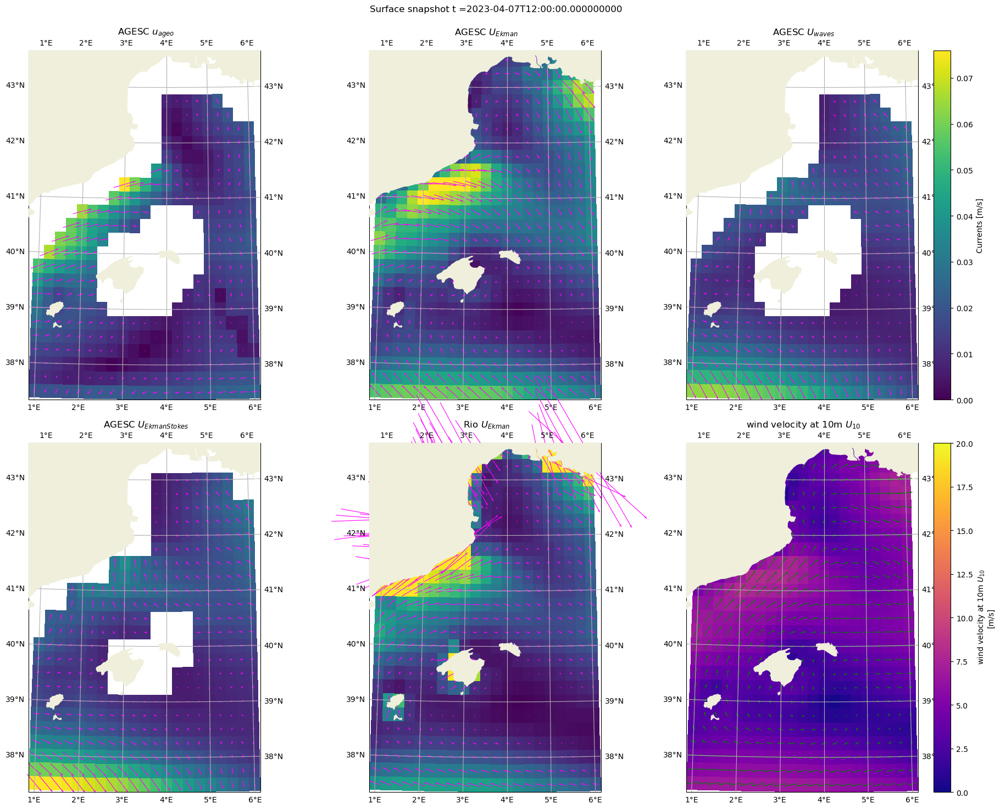

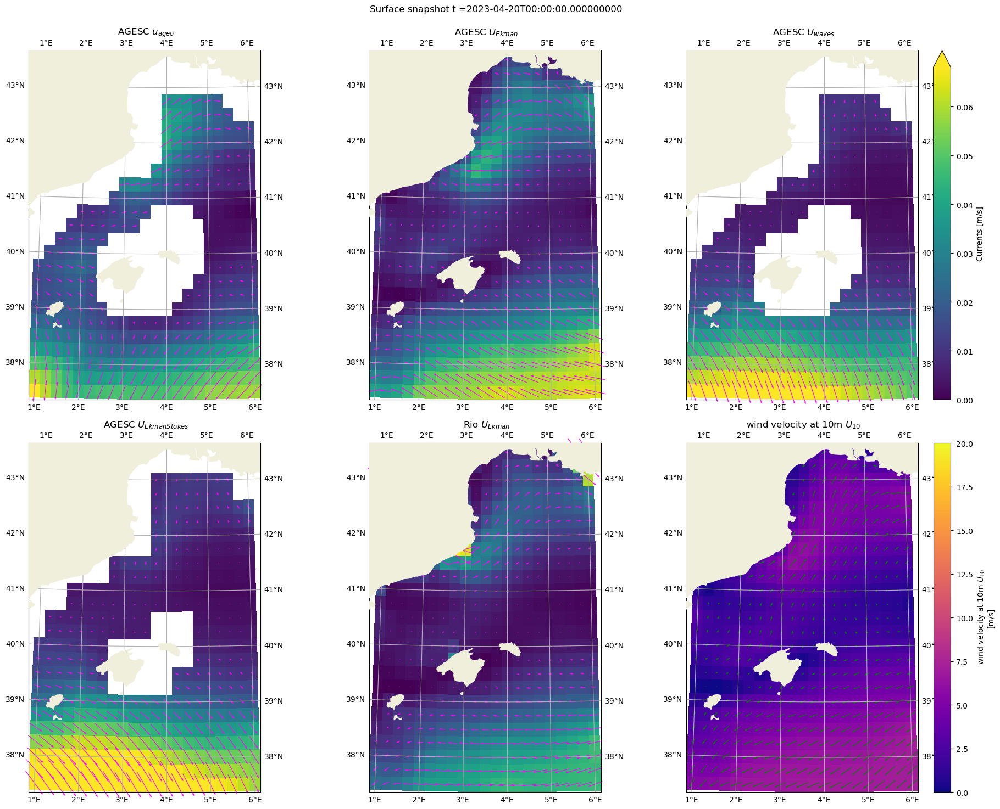

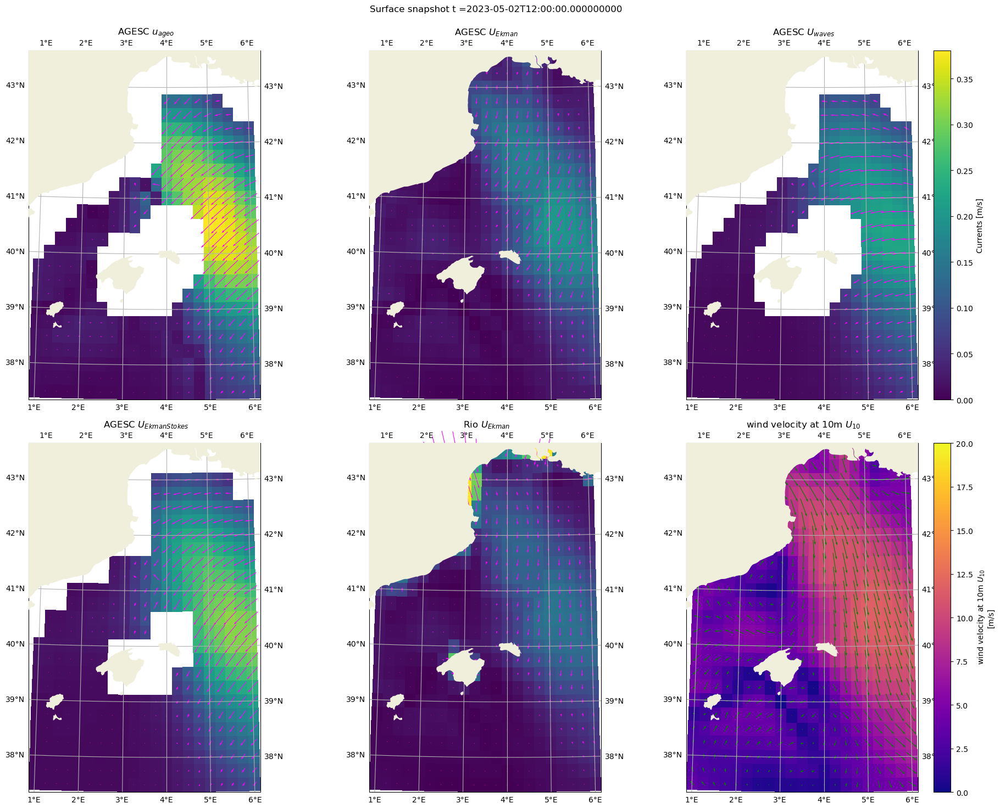

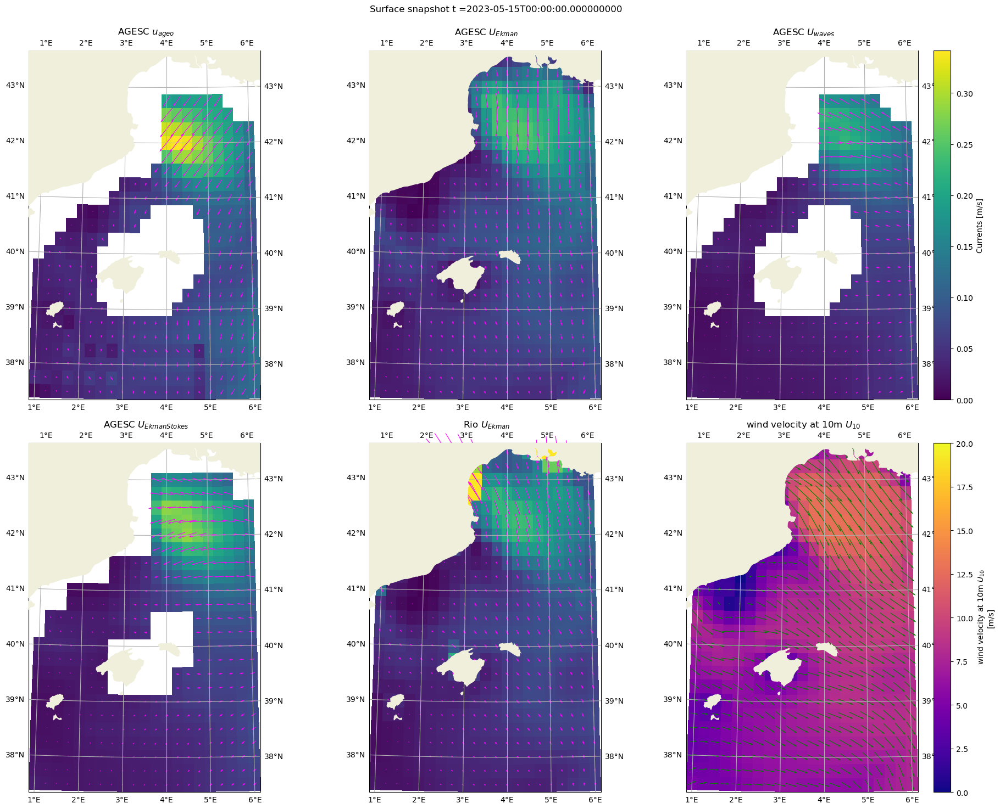

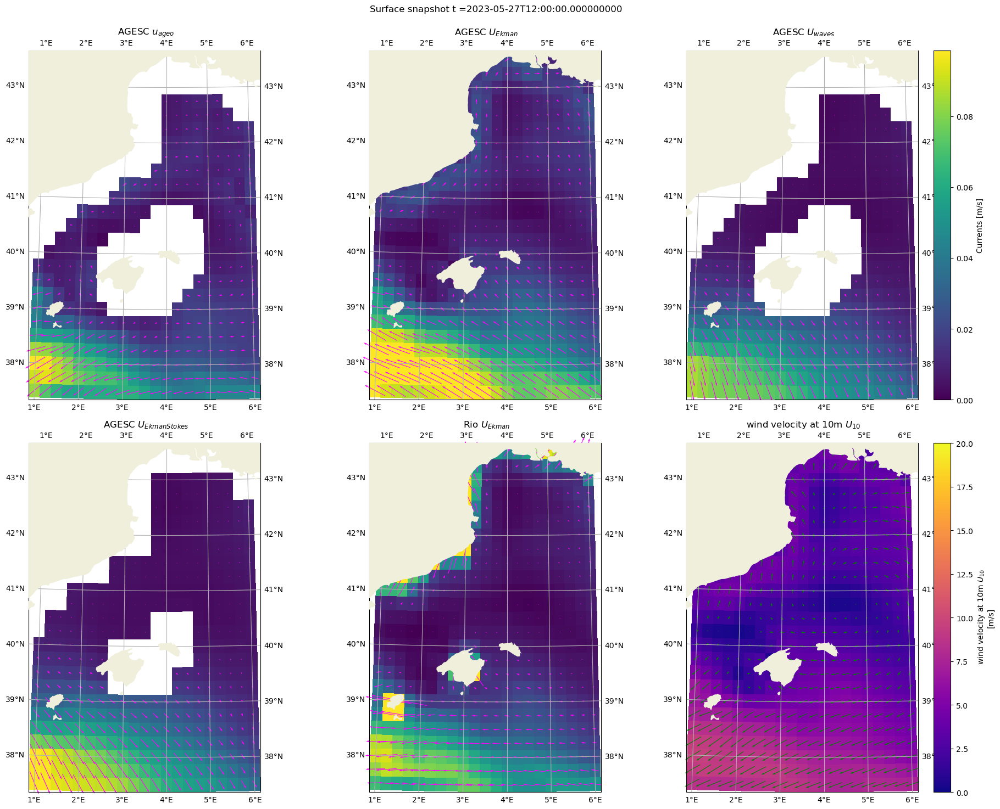

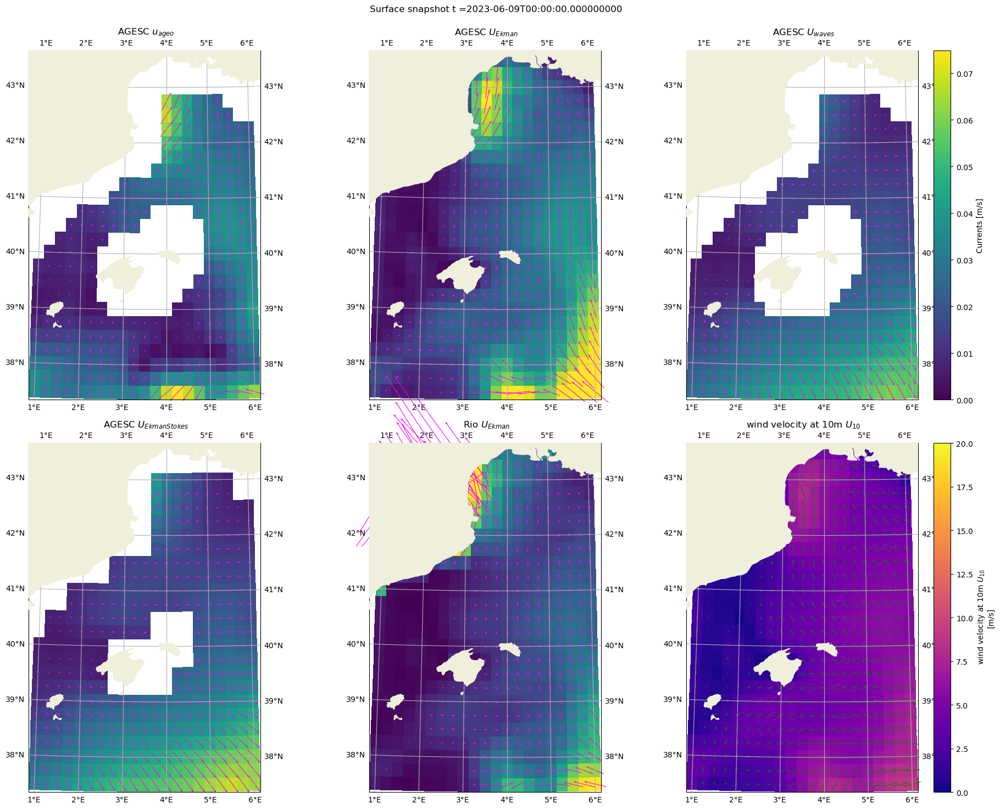

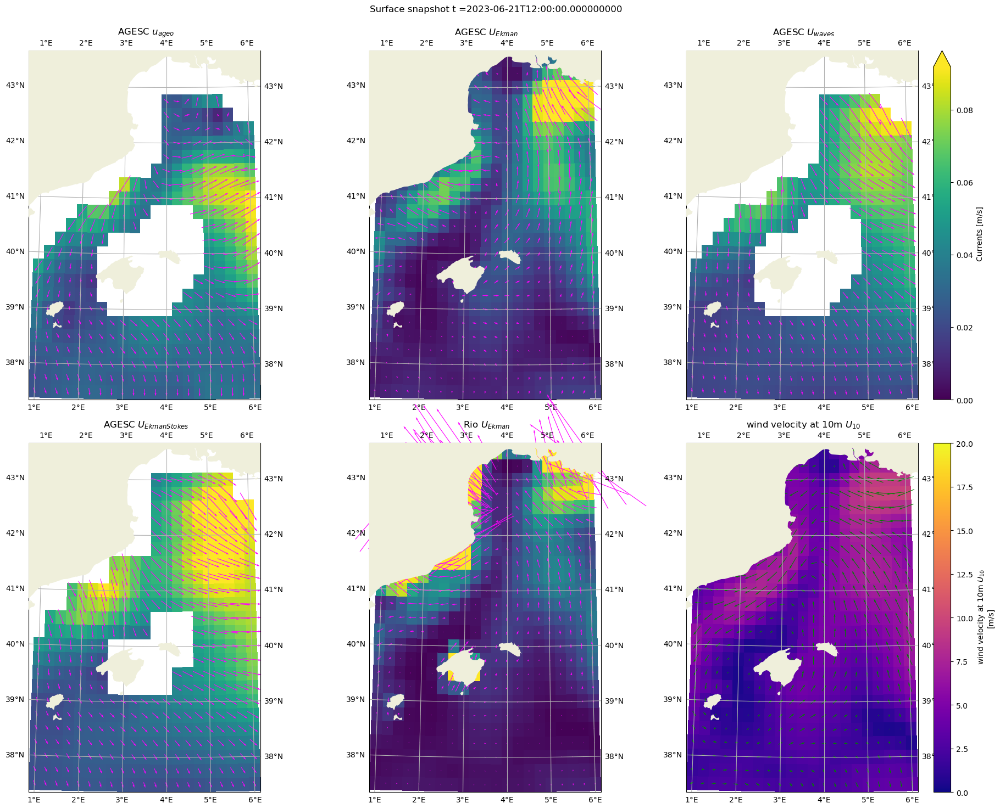

In [29]:
for i in range(0, 3000, 300):
    era_ = era0.isel(time=i)
    vmin, vmax = 0, era_.Ua.max().values
    
    fig = plt.figure(figsize=(12.5*1.5,10*1.5), frameon=False)
        
    ax = fig.add_subplot(231, projection=ccrs.Orthographic(4, 40.5))
    plot_u(era_, 'va', ax, vmin=vmin, vmax=vmax, add_colorbar = False)

    ax = fig.add_subplot(232, projection=ccrs.Orthographic(4, 40.5))
    plot_u(era_, 've', ax, vmin=vmin, vmax=vmax, add_colorbar = False)
    
    ax = fig.add_subplot(233, projection=ccrs.Orthographic(4, 40.5))
    plot_u( era_,'vw', ax, vmin=vmin, vmax=vmax, cbar_kwargs={'label': "Currents [m/s]"})
    
    ax = fig.add_subplot(234, projection=ccrs.Orthographic(4, 40.5))
    plot_u(era_, 'ves', ax, vmin=vmin, vmax=vmax, add_colorbar = False)
    
    ax = fig.add_subplot(235, projection=ccrs.Orthographic(4, 40.5))
    plot_u(era_, 'vrio', ax, vmin=vmin, vmax=vmax, add_colorbar = False)

    ax = fig.add_subplot(236, projection=ccrs.Orthographic(4, 40.5))
    plot_u(era_, 'v10', ax,vmin=0, vmax = 20, cmap='plasma')

    fig.tight_layout(rect = [0, 0, 1, 0.95])
    fig.suptitle(f'Surface snapshot t ={era_.time.values}')
    from cstes import images_dir
    fig.savefig(os.path.join(images_dir, 'agesc_images', f'surface_snapshot_{i}.png'))

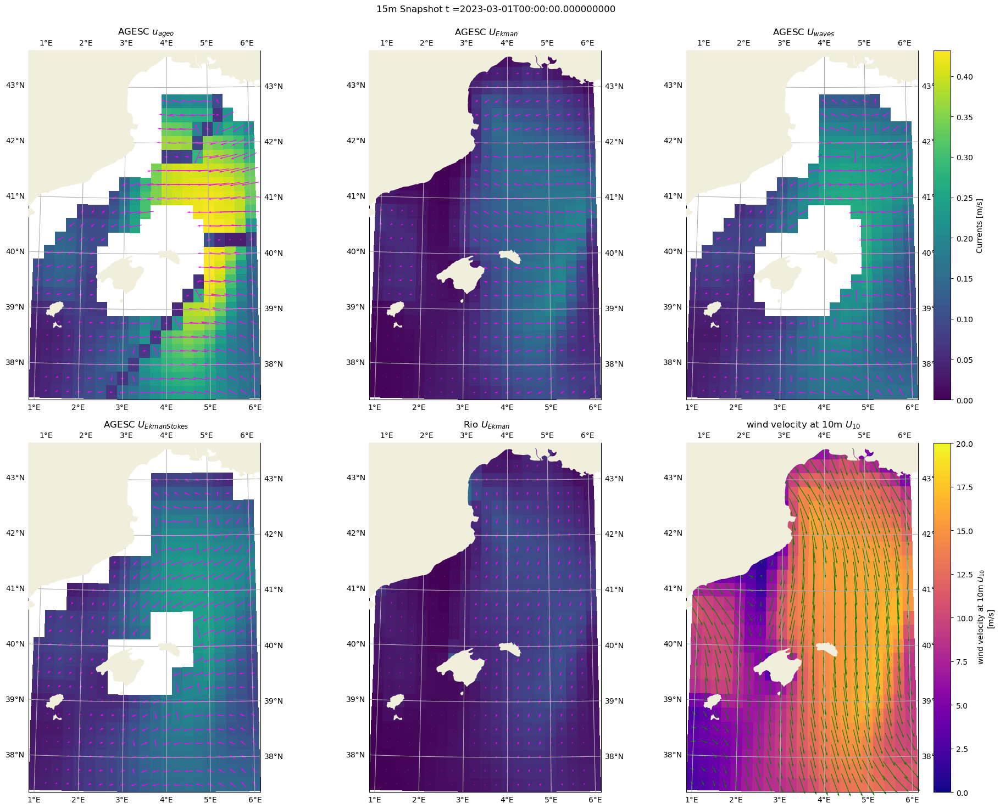

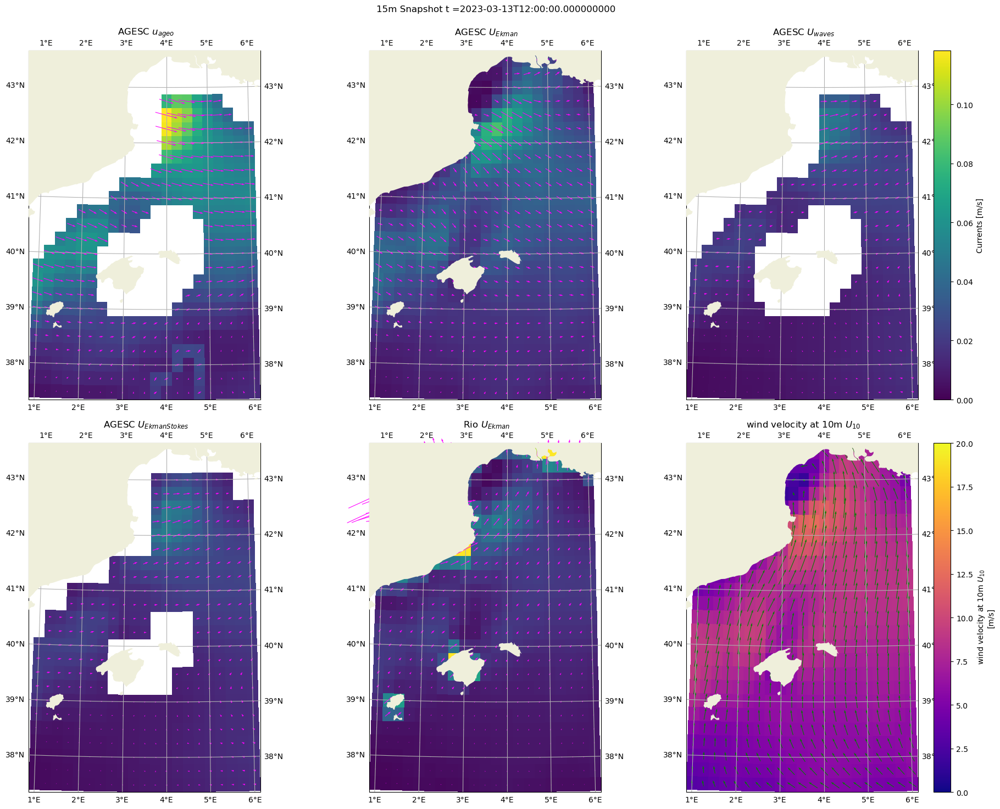

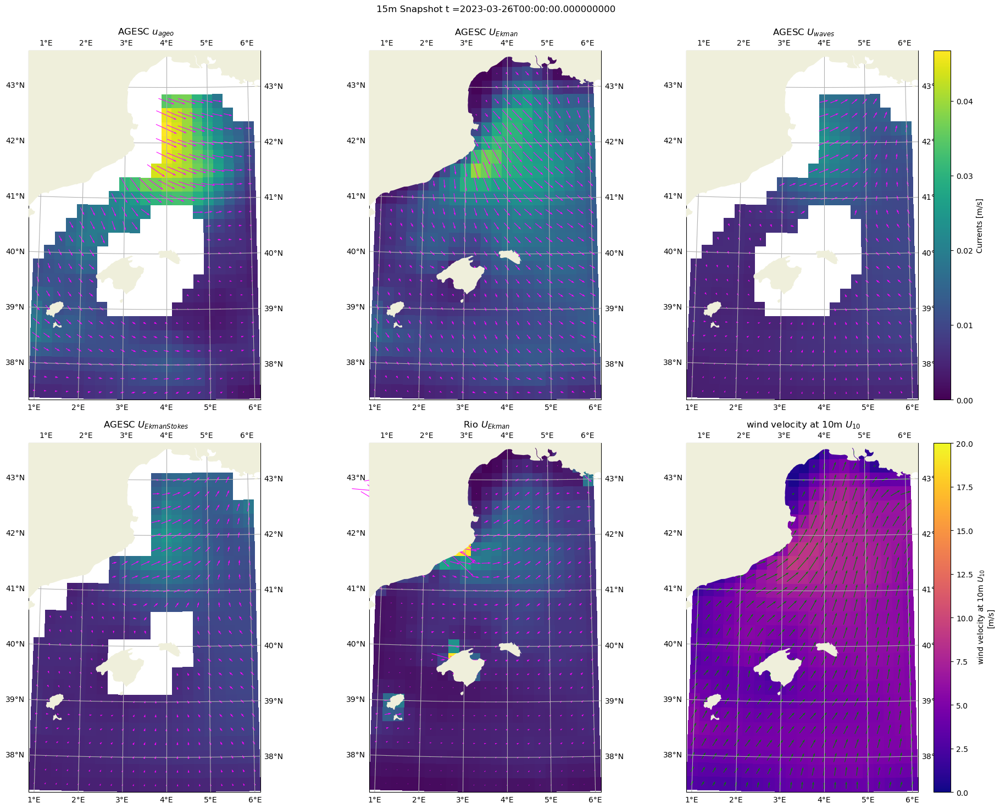

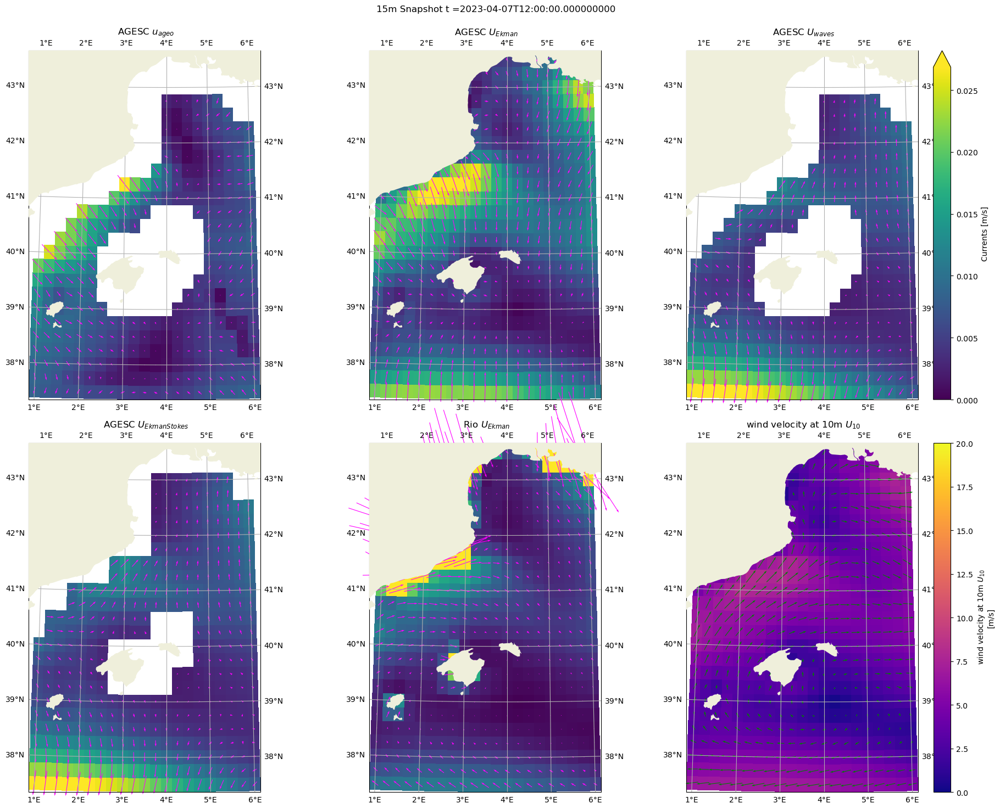

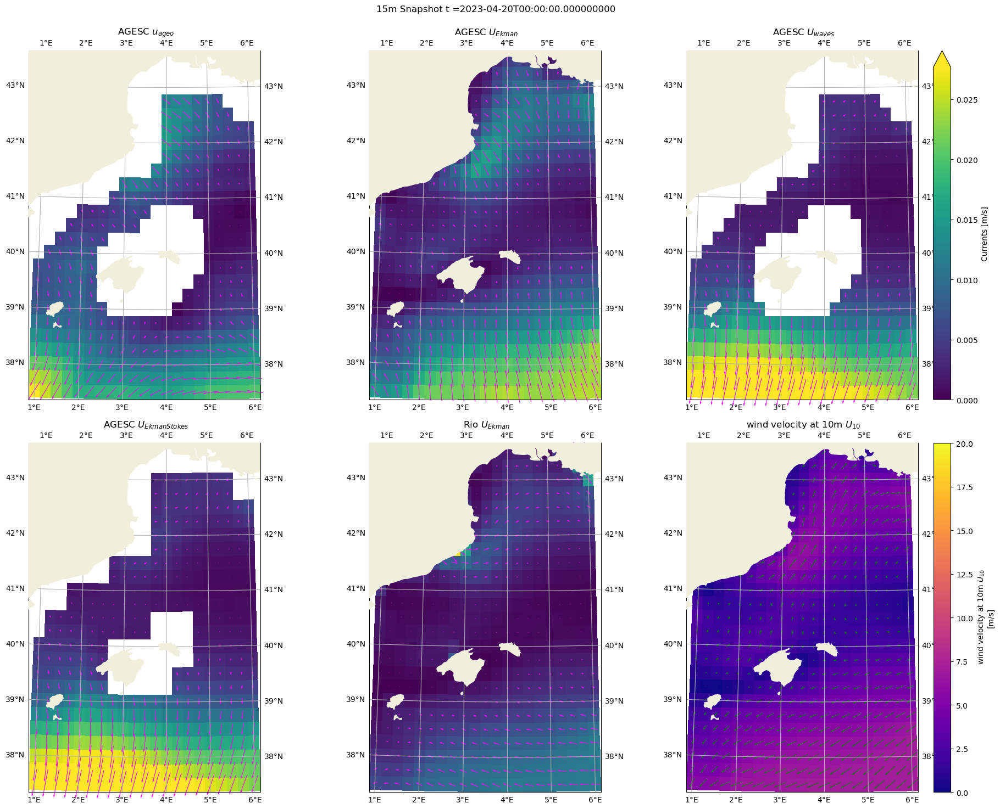

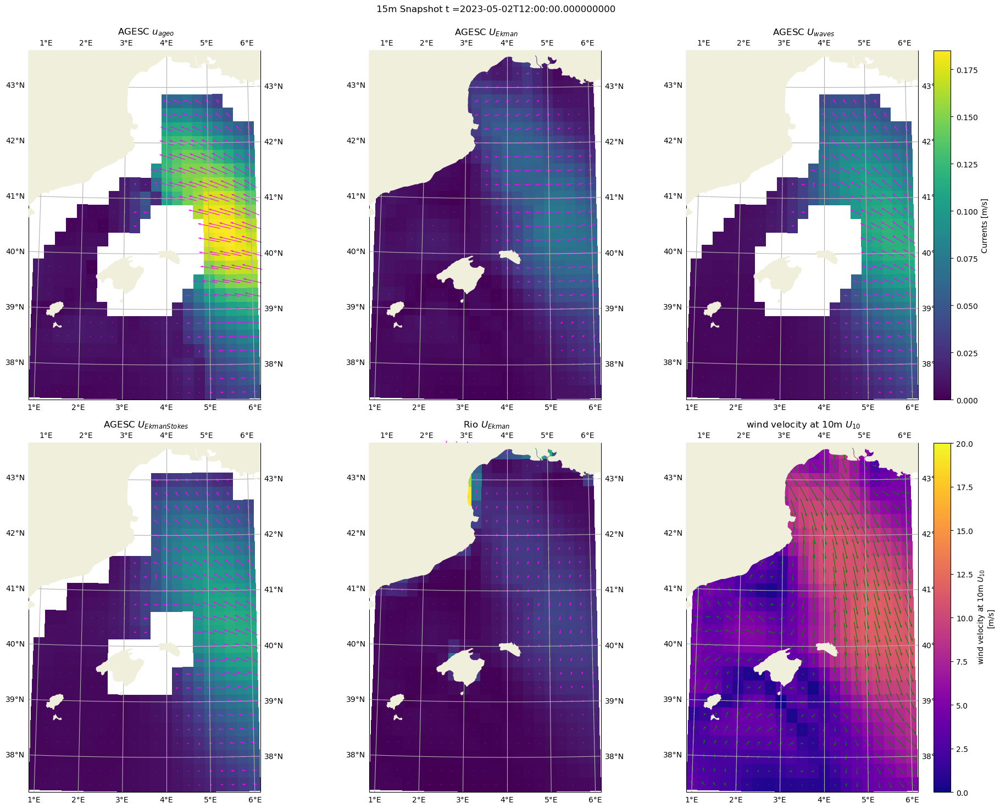

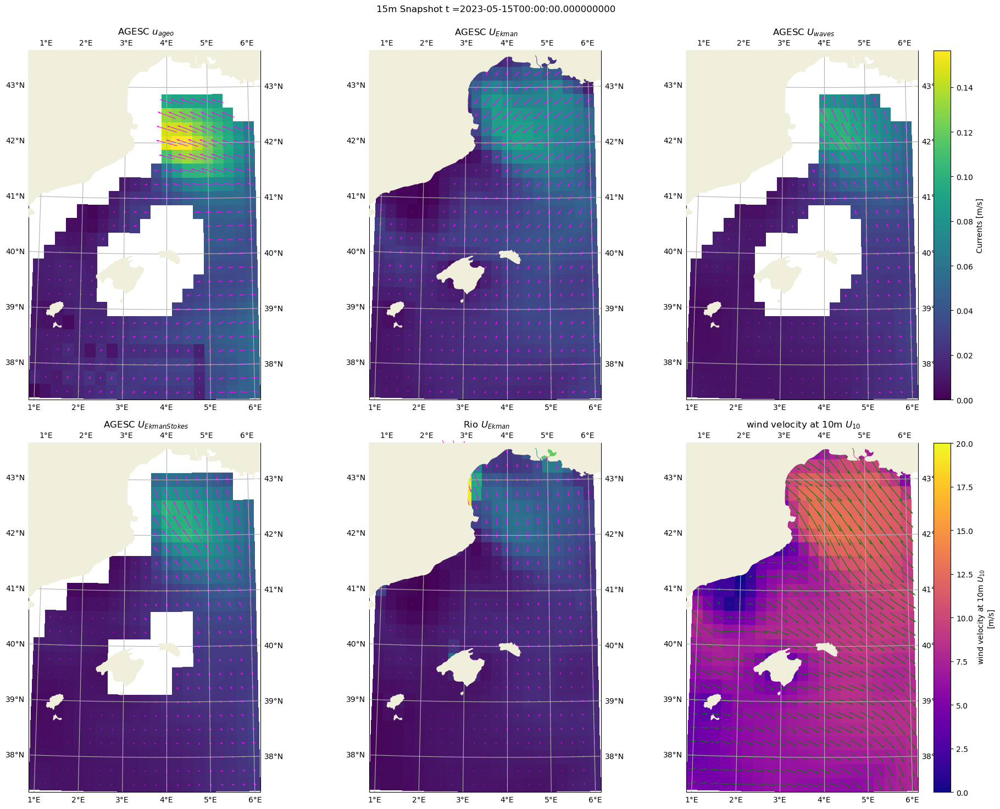

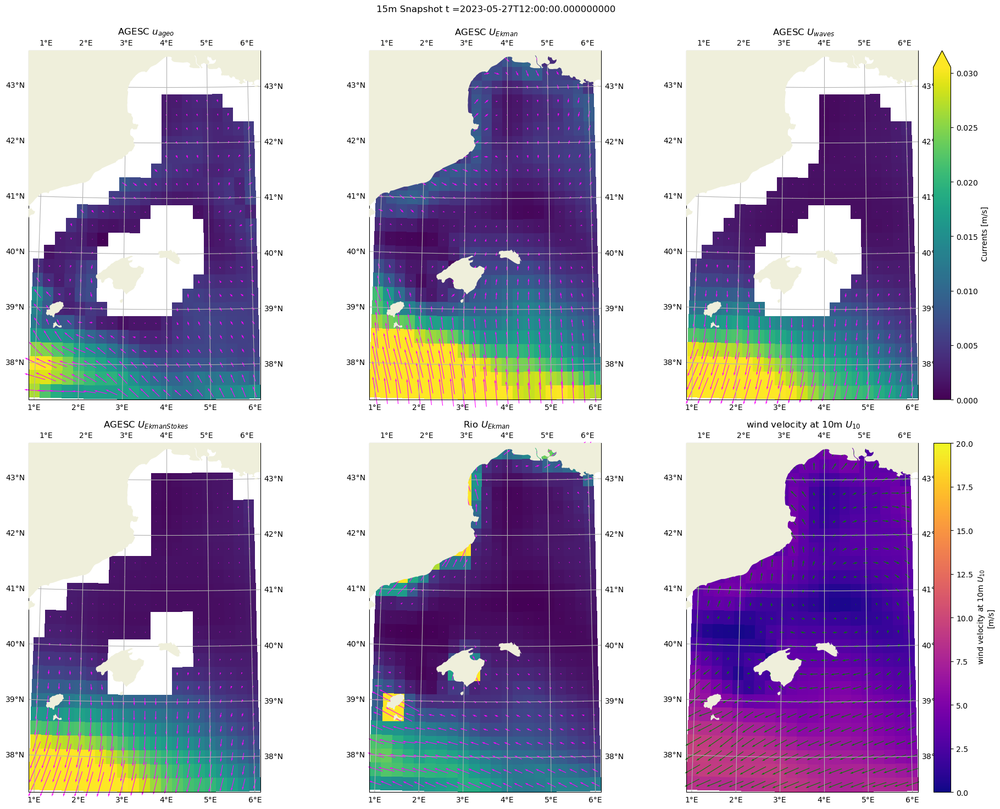

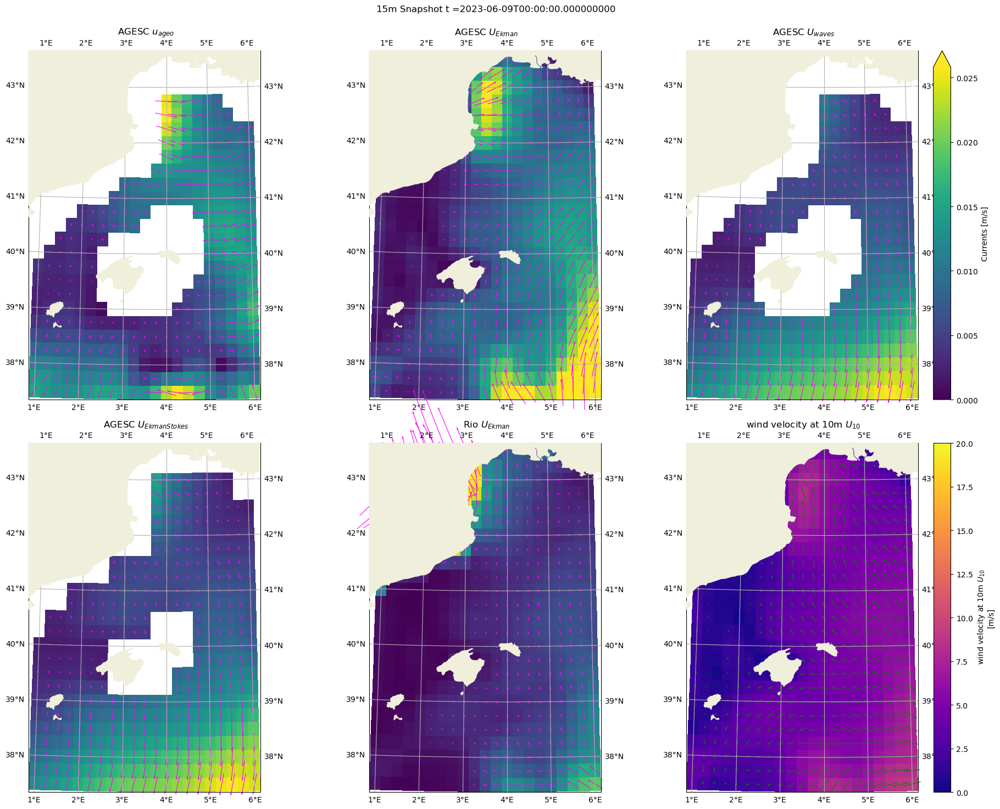

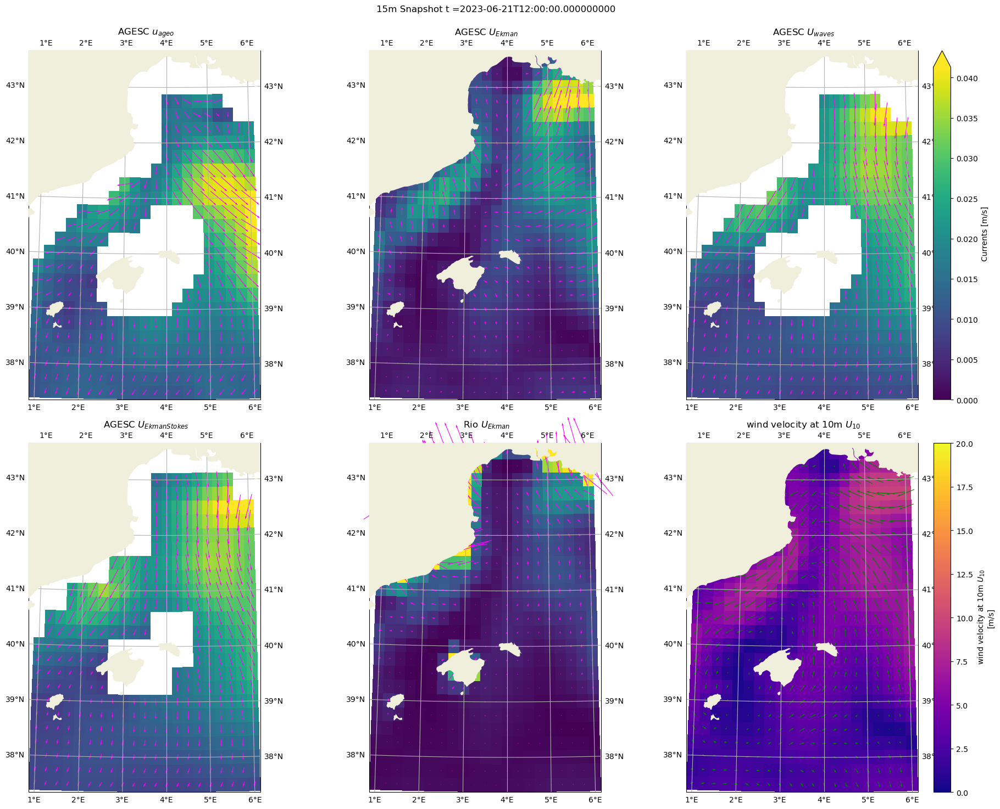

In [30]:
for i in range(0, 3000, 300):
    era_ = era15.isel(time=i)
    vmin, vmax = 0, era_.Ua.max().values
    
    fig = plt.figure(figsize=(12.5*1.5,10*1.5), frameon=False)
        
    ax = fig.add_subplot(231, projection=ccrs.Orthographic(4, 40.5))
    plot_u(era_, 'va', ax, vmin=vmin, vmax=vmax, add_colorbar = False)

    ax = fig.add_subplot(232, projection=ccrs.Orthographic(4, 40.5))
    plot_u(era_, 've', ax, vmin=vmin, vmax=vmax, add_colorbar = False)
    
    ax = fig.add_subplot(233, projection=ccrs.Orthographic(4, 40.5))
    plot_u( era_,'vw', ax, vmin=vmin, vmax=vmax, cbar_kwargs={'label': "Currents [m/s]"})
    
    ax = fig.add_subplot(234, projection=ccrs.Orthographic(4, 40.5))
    plot_u(era_, 'ves', ax, vmin=vmin, vmax=vmax, add_colorbar = False)
    
    ax = fig.add_subplot(235, projection=ccrs.Orthographic(4, 40.5))
    plot_u(era_, 'vrio', ax, vmin=vmin, vmax=vmax, add_colorbar = False)

    ax = fig.add_subplot(236, projection=ccrs.Orthographic(4, 40.5))
    plot_u(era_, 'v10', ax,vmin=0, vmax = 20, cmap='plasma')

    fig.tight_layout(rect = [0, 0, 1, 0.95])
    fig.suptitle(f'15m Snapshot t ={era_.time.values}')
    from cstes import images_dir
    fig.savefig(os.path.join(images_dir, 'agesc_images', f'15m_snapshot_{i}.png'))

# STD

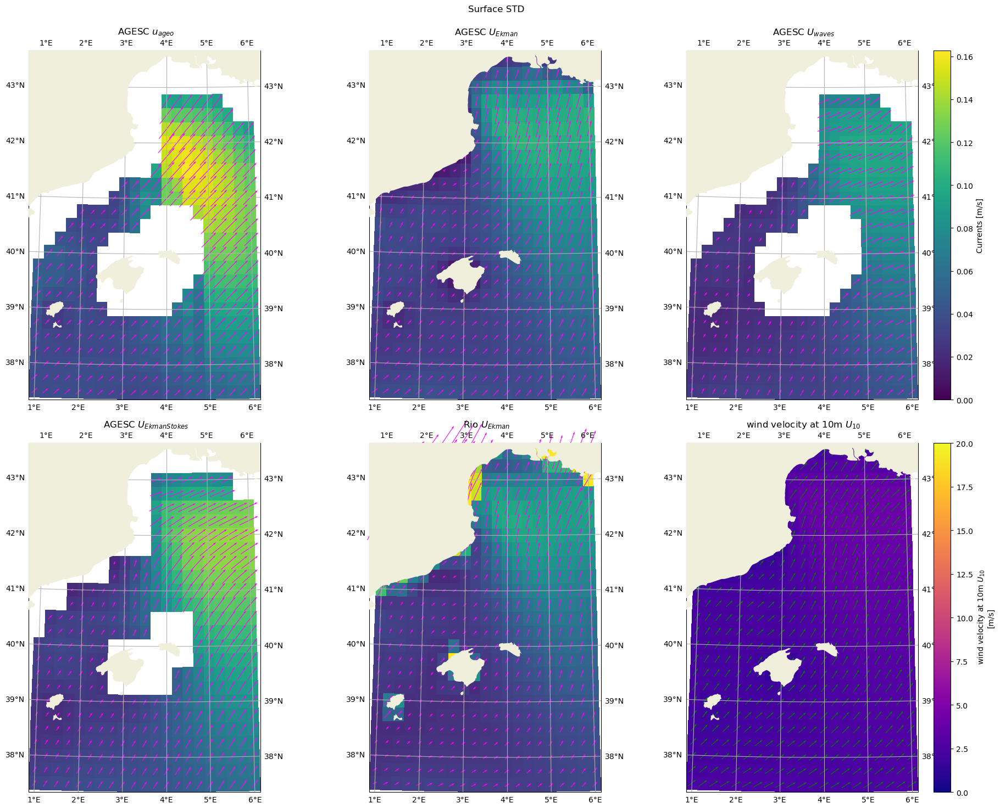

In [25]:

era_ = era0.std('time', keep_attrs=True)
vmin, vmax = 0, era_.Ua.max().values

fig = plt.figure(figsize=(12.5*1.5,10*1.5), frameon=False)
    
ax = fig.add_subplot(231, projection=ccrs.Orthographic(4, 40.5))
plot_u(era_, 'va', ax, vmin=vmin, vmax=vmax, add_colorbar = False)

ax = fig.add_subplot(232, projection=ccrs.Orthographic(4, 40.5))
plot_u(era_, 've', ax, vmin=vmin, vmax=vmax, add_colorbar = False)

ax = fig.add_subplot(233, projection=ccrs.Orthographic(4, 40.5))
plot_u( era_,'vw', ax, vmin=vmin, vmax=vmax, cbar_kwargs={'label': "Currents [m/s]"})

ax = fig.add_subplot(234, projection=ccrs.Orthographic(4, 40.5))
plot_u(era_, 'ves', ax, vmin=vmin, vmax=vmax, add_colorbar = False)

ax = fig.add_subplot(235, projection=ccrs.Orthographic(4, 40.5))
plot_u(era_, 'vrio', ax, vmin=vmin, vmax=vmax, add_colorbar = False)

ax = fig.add_subplot(236, projection=ccrs.Orthographic(4, 40.5))
plot_u(era_, 'v10', ax,vmin=0, vmax = 20, cmap='plasma')

fig.tight_layout(rect = [0, 0, 1, 0.95])
fig.suptitle(f'Surface STD')
from cstes import images_dir
fig.savefig(os.path.join(images_dir, 'agesc_images', f'surface_std.png'))

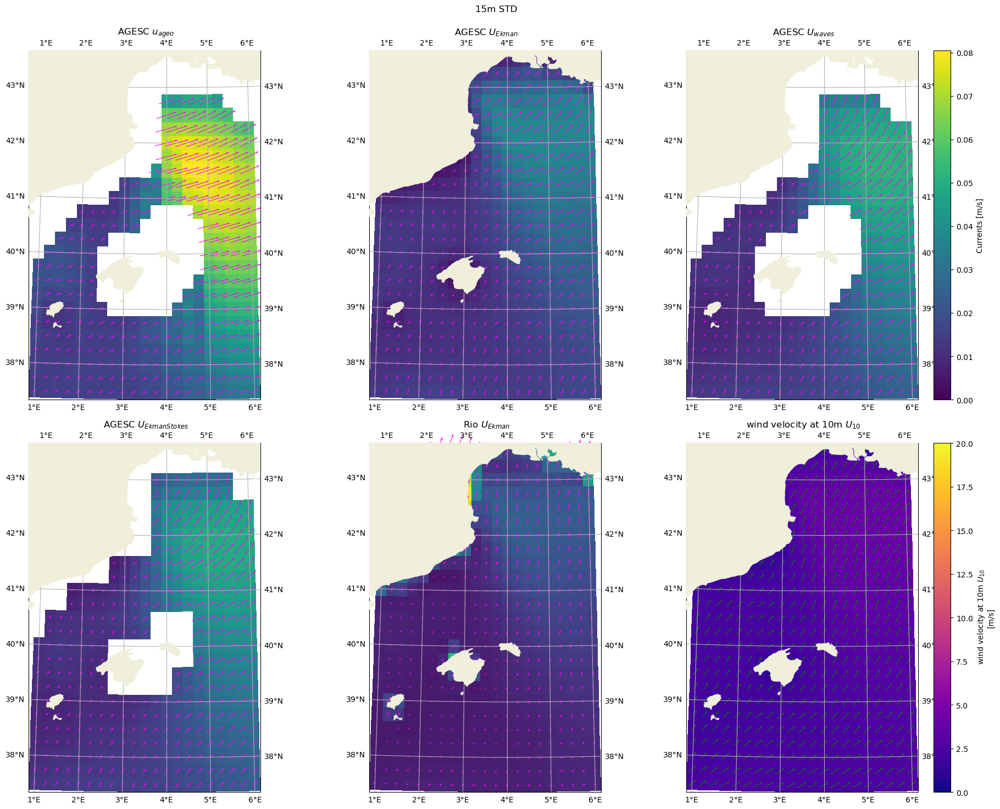

In [26]:
era_ = era15.std('time', keep_attrs=True)
vmin, vmax = 0, era_.Ua.max().values

fig = plt.figure(figsize=(12.5*1.5,10*1.5), frameon=False)
    
ax = fig.add_subplot(231, projection=ccrs.Orthographic(4, 40.5))
plot_u(era_, 'va', ax, vmin=vmin, vmax=vmax, add_colorbar = False)

ax = fig.add_subplot(232, projection=ccrs.Orthographic(4, 40.5))
plot_u(era_, 've', ax, vmin=vmin, vmax=vmax, add_colorbar = False)

ax = fig.add_subplot(233, projection=ccrs.Orthographic(4, 40.5))
plot_u( era_,'vw', ax, vmin=vmin, vmax=vmax, cbar_kwargs={'label': "Currents [m/s]"})

ax = fig.add_subplot(234, projection=ccrs.Orthographic(4, 40.5))
plot_u(era_, 'ves', ax, vmin=vmin, vmax=vmax, add_colorbar = False)

ax = fig.add_subplot(235, projection=ccrs.Orthographic(4, 40.5))
plot_u(era_, 'vrio', ax, vmin=vmin, vmax=vmax, add_colorbar = False)

ax = fig.add_subplot(236, projection=ccrs.Orthographic(4, 40.5))
plot_u(era_, 'v10', ax,vmin=0, vmax = 20, cmap='plasma')

fig.tight_layout(rect = [0, 0, 1, 0.95])
fig.suptitle(f'15m STD')
from cstes import images_dir
fig.savefig(os.path.join(images_dir, 'agesc_images', f'15m_std.png'))

# Mean

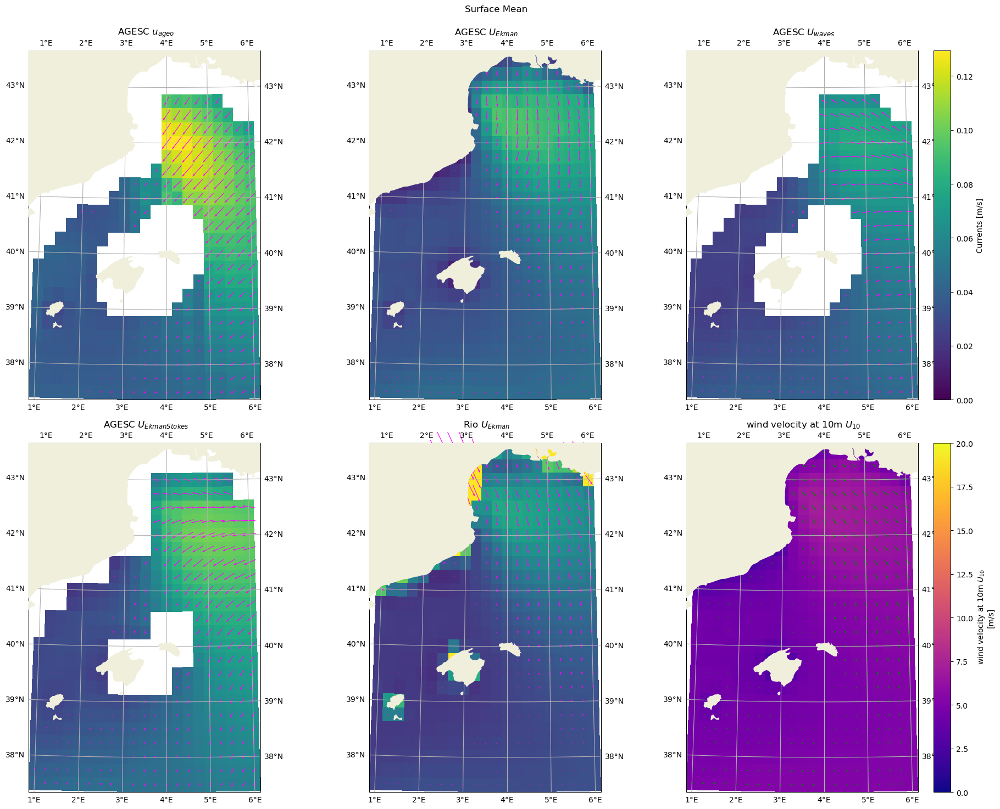

In [27]:

era_ = era0.mean('time', keep_attrs=True)
vmin, vmax = 0, era_.Ua.max().values

fig = plt.figure(figsize=(12.5*1.5,10*1.5), frameon=False)
    
ax = fig.add_subplot(231, projection=ccrs.Orthographic(4, 40.5))
plot_u(era_, 'va', ax, vmin=vmin, vmax=vmax, add_colorbar = False)

ax = fig.add_subplot(232, projection=ccrs.Orthographic(4, 40.5))
plot_u(era_, 've', ax, vmin=vmin, vmax=vmax, add_colorbar = False)

ax = fig.add_subplot(233, projection=ccrs.Orthographic(4, 40.5))
plot_u( era_,'vw', ax, vmin=vmin, vmax=vmax, cbar_kwargs={'label': "Currents [m/s]"})

ax = fig.add_subplot(234, projection=ccrs.Orthographic(4, 40.5))
plot_u(era_, 'ves', ax, vmin=vmin, vmax=vmax, add_colorbar = False)

ax = fig.add_subplot(235, projection=ccrs.Orthographic(4, 40.5))
plot_u(era_, 'vrio', ax, vmin=vmin, vmax=vmax, add_colorbar = False)

ax = fig.add_subplot(236, projection=ccrs.Orthographic(4, 40.5))
plot_u(era_, 'v10', ax,vmin=0, vmax = 20, cmap='plasma')

fig.tight_layout(rect = [0, 0, 1, 0.95])
fig.suptitle(f'Surface Mean')
from cstes import images_dir
fig.savefig(os.path.join(images_dir, 'agesc_images', f'surface_mean.png'))

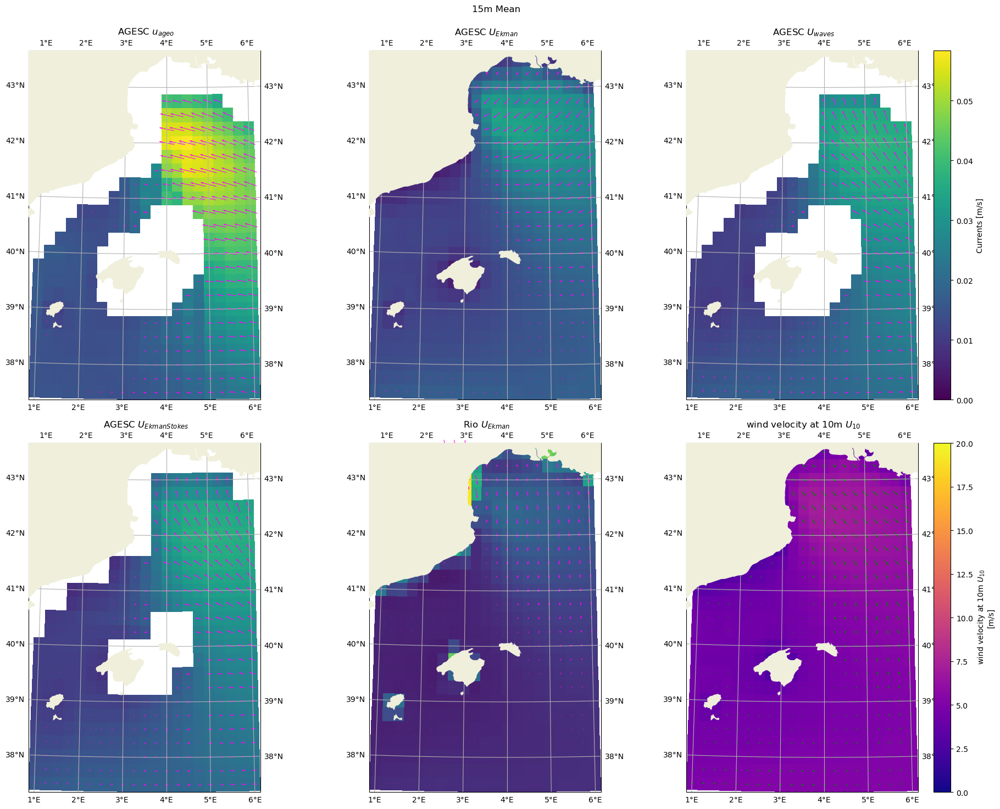

In [28]:
era_ = era15.mean('time', keep_attrs=True)
vmin, vmax = 0, era_.Ua.max().values

fig = plt.figure(figsize=(12.5*1.5,10*1.5), frameon=False)
    
ax = fig.add_subplot(231, projection=ccrs.Orthographic(4, 40.5))
plot_u(era_, 'va', ax, vmin=vmin, vmax=vmax, add_colorbar = False)

ax = fig.add_subplot(232, projection=ccrs.Orthographic(4, 40.5))
plot_u(era_, 've', ax, vmin=vmin, vmax=vmax, add_colorbar = False)

ax = fig.add_subplot(233, projection=ccrs.Orthographic(4, 40.5))
plot_u( era_,'vw', ax, vmin=vmin, vmax=vmax, cbar_kwargs={'label': "Currents [m/s]"})

ax = fig.add_subplot(234, projection=ccrs.Orthographic(4, 40.5))
plot_u(era_, 'ves', ax, vmin=vmin, vmax=vmax, add_colorbar = False)

ax = fig.add_subplot(235, projection=ccrs.Orthographic(4, 40.5))
plot_u(era_, 'vrio', ax, vmin=vmin, vmax=vmax, add_colorbar = False)

ax = fig.add_subplot(236, projection=ccrs.Orthographic(4, 40.5))
plot_u(era_, 'v10', ax,vmin=0, vmax = 20, cmap='plasma')

fig.tight_layout(rect = [0, 0, 1, 0.95])
fig.suptitle(f'15m Mean')
from cstes import images_dir
fig.savefig(os.path.join(images_dir, 'agesc_images', f'15m_mean.png'))